In [1]:
!nvidia-smi || true
!pip -q install -U "diffusers[torch]" transformers accelerate safetensors huggingface_hub
!pip -q install -U "xformers" || echo "xformers failed to install (not required)."
!pip -q install -U pillow einops


Fri Sep 26 13:53:55 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   61C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
from huggingface_hub import notebook_login
notebook_login()

In [3]:
import torch
from diffusers import StableDiffusionPipeline

model_id = "runwayml/stable-diffusion-v1-5"


pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16,
    safety_checker=None,
)


if torch.cuda.is_available():
    pipe = pipe.to("cuda")
else:
    pipe = pipe.to("cpu")


pipe.enable_attention_slicing()
try:
    pipe.enable_xformers_memory_efficient_attention()
except Exception:
    pass

print("Pipeline ready. Device:", next(pipe.unet.parameters()).device)


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Pipeline ready. Device: cuda:0


In [7]:
import os
import time
import random
import math
from pathlib import Path
from datetime import datetime

import torch
import pandas as pd
from PIL import Image


DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", DEVICE)


OUTDIR = Path("outputs")
OUTDIR.mkdir(parents=True, exist_ok=True)


if "pipe" not in globals():
    raise RuntimeError(
        "The variable `pipe` (StableDiffusionPipeline) is not defined. "
        "Please run the model-loading cell (the cell that calls StableDiffusionPipeline.from_pretrained(...)) "
        "before running this helper functions cell."
    )

def generate_images(
    prompt,
    num_images=5,
    width=512,
    height=512,
    steps=30,
    guidance=7.5,
    seeds=None,
    negative_prompt=None,
    prompt_styles=None,
    outdir=OUTDIR
):
    """
    Generate `num_images` images using the already-loaded `pipe`.
    Returns list of metadata dicts for generated images.
    """
    outdir = Path(outdir)
    outdir.mkdir(parents=True, exist_ok=True)
    results = []


    if seeds is None:
        seeds = [random.randrange(0, 2**31) for _ in range(num_images)]
    elif isinstance(seeds, int):
        seeds = [seeds + i for i in range(num_images)]
    elif len(seeds) < num_images:
        seeds = list(seeds) + [random.randrange(0, 2**31) for _ in range(num_images - len(seeds))]

    for i in range(num_images):
        seed = seeds[i]
        full_prompt = prompt
        if prompt_styles and i < len(prompt_styles):
            full_prompt = f"{prompt}, {prompt_styles[i]}"

        generator = torch.Generator(device=DEVICE).manual_seed(seed)


        if DEVICE == "cuda":

            try:
                with torch.autocast("cuda"):
                    out = pipe(
                        full_prompt,
                        height=height,
                        width=width,
                        guidance_scale=guidance,
                        num_inference_steps=steps,
                        negative_prompt=negative_prompt,
                        generator=generator,
                    )
            except Exception:

                with torch.cuda.amp.autocast():
                    out = pipe(
                        full_prompt,
                        height=height,
                        width=width,
                        guidance_scale=guidance,
                        num_inference_steps=steps,
                        negative_prompt=negative_prompt,
                        generator=generator,
                    )
        else:

            with torch.no_grad():
                out = pipe(
                    full_prompt,
                    height=height,
                    width=width,
                    guidance_scale=guidance,
                    num_inference_steps=steps,
                    negative_prompt=negative_prompt,
                    generator=generator,
                )

        image = out.images[0]
        fname = f"{int(time.time())}_{i}_seed{seed}.png"
        fpath = outdir / fname
        image.save(fpath)

        results.append({
            "prompt": full_prompt,
            "seed": seed,
            "steps": steps,
            "guidance": guidance,
            "width": width,
            "height": height,
            "file": str(fpath),
            "time": datetime.utcnow().isoformat() + "Z"
        })
        print("Saved:", fpath)

    return results

def make_grid(image_paths, rows=1):
    """
    Build a simple grid image from a list of image file paths.
    """
    imgs = [Image.open(p).convert("RGB") for p in image_paths]
    widths, heights = zip(*(i.size for i in imgs))
    max_w, max_h = max(widths), max(heights)
    cols = math.ceil(len(imgs) / rows)
    grid = Image.new("RGB", (cols * max_w, rows * max_h), color=(255,255,255))
    for idx, im in enumerate(imgs):
        x = (idx % cols) * max_w
        y = (idx // cols) * max_h
        grid.paste(im, (x, y))
    return grid

def save_metadata(results, csv_path=OUTDIR/"metadata.csv"):
    """
    Save (append) metadata for generated images to a CSV.
    """
    df = pd.DataFrame(results)
    csv_path = Path(csv_path)
    if csv_path.exists():
        try:
            df_old = pd.read_csv(csv_path)
            df = pd.concat([df_old, df], ignore_index=True)
        except Exception as e:
            print("Warning: failed to read existing metadata CSV (will overwrite). Error:", e)
    df.to_csv(csv_path, index=False)
    print("Metadata saved to", csv_path)
    return csv_path

print("Helper functions loaded. Use generate_images(...), make_grid(...), save_metadata(...).")


Using device: cuda
Helper functions loaded. Use generate_images(...), make_grid(...), save_metadata(...).


  0%|          | 0/35 [00:00<?, ?it/s]

Saved: outputs/1758895774_0_seed1800291209.png


/tmp/ipython-input-3113943238.py:120: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "time": datetime.utcnow().isoformat() + "Z"


  0%|          | 0/35 [00:00<?, ?it/s]

Saved: outputs/1758895797_1_seed570462953.png


  0%|          | 0/35 [00:00<?, ?it/s]

Saved: outputs/1758895820_2_seed1730583036.png


  0%|          | 0/35 [00:00<?, ?it/s]

Saved: outputs/1758895843_3_seed735194805.png


  0%|          | 0/35 [00:00<?, ?it/s]

Saved: outputs/1758895866_4_seed1183729719.png


  0%|          | 0/35 [00:00<?, ?it/s]

Saved: outputs/1758895889_5_seed1507360433.png
Grid saved to: outputs/grid_preview.png
Metadata saved to outputs/metadata.csv


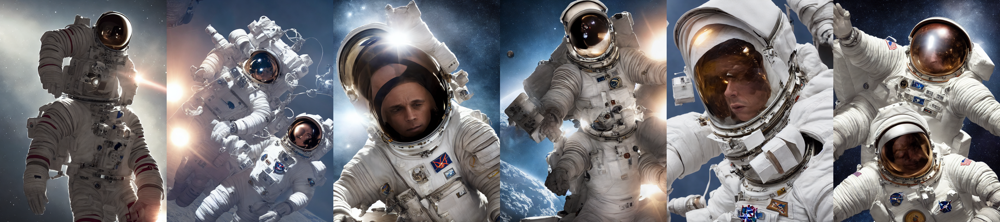

In [6]:
PROMPT = "A cinematic portrait of an astronaut, photorealistic, dramatic rim light, ultra-detailed"
NEG_PROMPT = "lowres, blurry, watermark, deformed"
NUM_IMAGES = 6
WIDTH = 768
HEIGHT = 1024
STEPS = 35
GUIDANCE = 8.5

results = generate_images(
    prompt=PROMPT,
    num_images=NUM_IMAGES,
    width=WIDTH,
    height=HEIGHT,
    steps=STEPS,
    guidance=GUIDANCE,
    negative_prompt=NEG_PROMPT
)


grid = make_grid([r["file"] for r in results], rows=1)
preview_path = OUTDIR / "grid_preview.png"
grid.save(preview_path)
print("Grid saved to:", preview_path)


save_metadata(results)

display(grid)


In [11]:
import gradio as gr

def gr_gen(prompt, negative_prompt="lowres, blurry", num_images=3, width=512, height=512, steps=30, guidance=7.5, seed=0):
    seeds = None
    if seed and seed > 0:
        seeds = [seed + i for i in range(num_images)]
    res = generate_images(prompt, num_images=num_images, width=width, height=height, steps=steps, guidance=guidance, seeds=seeds, negative_prompt=negative_prompt)
    return [r["file"] for r in res]

demo = gr.Interface(
    fn=gr_gen,
    inputs=[
        gr.Textbox(lines=2, label="Prompt"),
        gr.Textbox(lines=1, label="Negative prompt", value="lowres, blurry, watermark"),
        gr.Slider(1, 6, step=1, value=3, label="Number of images"),
        gr.Number(value=512, label="Width"),
        gr.Number(value=512, label="Height"),
        gr.Slider(10, 50, value=30, label="Steps"),
        gr.Slider(1.0, 12.0, value=7.5, label="Guidance"),
        gr.Number(value=0, label="Seed (0=random)")
    ],
    outputs=gr.Gallery(label="Generated Images"),
    title="HF Diffusers Text→Image"
)


demo.launch(share=False)


Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Note: opening Chrome Inspector may crash demo inside Colab notebooks.
* To create a public link, set `share=True` in `launch()`.


<IPython.core.display.Javascript object>